# Data Preparation

In [1]:
from google.colab import drive # the real images data files take too long (about 17 minutes) to be downloaded, so we just mount it
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!tar -xzf /content/drive/MyDrive/nuimages/nuimages-v1.0-all-metadata.tgz && tar -xzf /content/drive/MyDrive/nuimages/nuimages-v1.0-all-samples.tgz # this will take about 7 minutes

In [3]:
drive.flush_and_unmount()

In [ ]:
!rm -rf train2017/ val2017/ annotations/ train.txt val.txt train.json val.json

In [4]:
!mkdir train2017 val2017 annotations

In [5]:
import sys
sys.path.append('/content/') # path where data_preparation.py is. Modify accordingly if needed

# import importlib # use this if you make changes to the data_preparation.py and want to reflect the changes in the notebook
# importlib.reload(data_preparation)

import data_preparation

In [6]:
train_df, val_df, class_list = data_preparation.get_df_and_class_list('/content/', 100, 100, train_random_sample=False, val_random_sample=False, class_type = "category_and_attribute")

In [7]:
class_list

['animal',
 'animal+pedestrian.moving+vertical_position.off_ground',
 'animal+pedestrian.moving+vertical_position.on_ground',
 'animal+pedestrian.sitting_lying_down+vertical_position.off_ground',
 'animal+pedestrian.sitting_lying_down+vertical_position.on_ground',
 'animal+pedestrian.standing+vertical_position.off_ground',
 'animal+pedestrian.standing+vertical_position.on_ground',
 'human.pedestrian.adult',
 'human.pedestrian.adult+pedestrian.moving',
 'human.pedestrian.adult+pedestrian.moving+vertical_position.on_ground',
 'human.pedestrian.adult+pedestrian.sitting_lying_down',
 'human.pedestrian.adult+pedestrian.standing',
 'human.pedestrian.child',
 'human.pedestrian.child+pedestrian.moving',
 'human.pedestrian.child+pedestrian.sitting_lying_down',
 'human.pedestrian.child+pedestrian.standing',
 'human.pedestrian.construction_worker',
 'human.pedestrian.construction_worker+pedestrian.moving',
 'human.pedestrian.construction_worker+pedestrian.sitting_lying_down',
 'human.pedestrian.c

In [8]:
data_preparation.create_image_filename_list_txt('train', train_df)
data_preparation.create_image_filename_list_txt('val', val_df)

In [9]:
data_preparation.df_to_coco_format(val_df, 'val', class_list)
data_preparation.df_to_coco_format(train_df, 'train', class_list)

In [11]:
# make sure the val.txt exists before running this
# copy the val image to directory expected by yolo. should take about 1 minute for the entire dataset
!xargs -a val.txt -P8 -I{} cp "/content/{}" /content/val2017/

In [12]:
# make sure the train.txt exists before running this
# copy the train image to directory expected by yolo. should take about 5 minutes for the entire dataset
!xargs -a train.txt -P8 -I{} cp "/content/{}" /content/train2017/

In [13]:
# this is just to see the number of occurence of each class
data_preparation.count_category_occurrences('/content/val.json')

loading annotations into memory...
Done (t=2.01s)
creating index...
index created!
Category 'vehicle.truck+vehicle.moving' (ID 75): 2872 instances
Category 'vehicle.construction+vehicle.parked' (ID 50): 1092 instances
Category 'vehicle.motorcycle+cycle.without_rider' (ID 69): 1934 instances
Category 'movable_object.barrier' (ID 28): 18433 instances
Category 'vehicle.car+vehicle.moving' (ID 44): 18269 instances
Category 'human.pedestrian.adult+pedestrian.standing' (ID 11): 7186 instances
Category 'human.pedestrian.adult+pedestrian.sitting_lying_down' (ID 10): 2827 instances
Category 'movable_object.trafficcone' (ID 31): 18587 instances
Category 'vehicle.car+vehicle.parked' (ID 45): 25152 instances
Category 'human.pedestrian.construction_worker+pedestrian.standing' (ID 19): 2059 instances
Category 'human.pedestrian.adult+pedestrian.moving' (ID 8): 18706 instances
Category 'movable_object.debris' (ID 29): 710 instances
Category 'static_object.bicycle_rack' (ID 32): 603 instances
Category 

defaultdict(int,
            {75: 2872,
             50: 1092,
             69: 1934,
             28: 18433,
             44: 18269,
             11: 7186,
             10: 2827,
             31: 18587,
             45: 25152,
             19: 2059,
             8: 18706,
             29: 710,
             32: 603,
             76: 3219,
             46: 3855,
             72: 273,
             35: 3114,
             17: 706,
             68: 1161,
             71: 179,
             40: 1199,
             18: 351,
             4: 7,
             26: 70,
             77: 766,
             25: 74,
             42: 292,
             30: 645,
             22: 432,
             41: 332,
             37: 43,
             34: 233,
             51: 141,
             66: 15,
             2: 17,
             13: 139,
             6: 48,
             49: 70,
             24: 2,
             15: 87,
             23: 20,
             73: 34,
             43: 3,
             21: 21,
             38

loading annotations into memory...
Done (t=4.37s)
creating index...
index created!
File name:  n008-2018-05-30-15-20-59-0400__CAM_FRONT_RIGHT__1527708946769956.jpg
Image path:  /content/train2017/n008-2018-05-30-15-20-59-0400__CAM_FRONT_RIGHT__1527708946769956.jpg


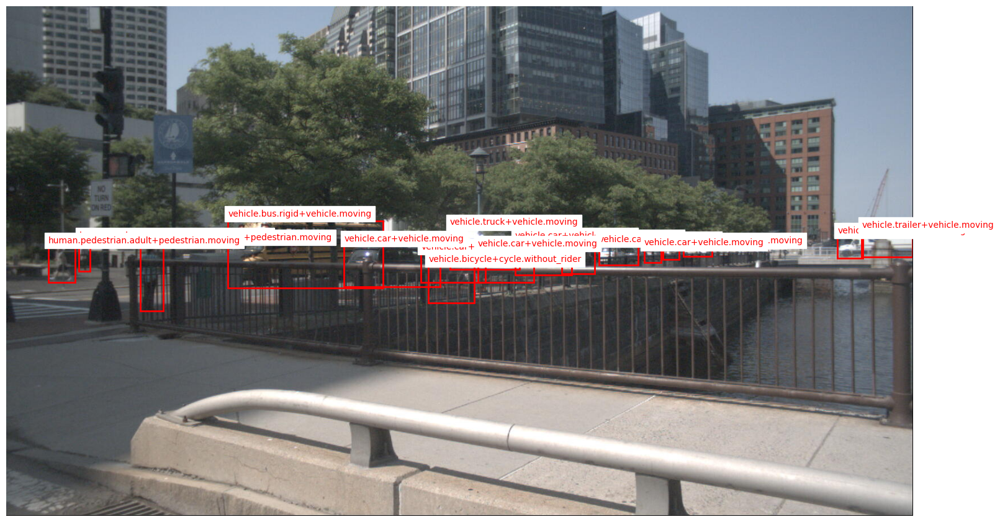

In [13]:
coco_json = '/content/train.json'
image_path = '/content/train2017/'
data_preparation.display_image_from_coco_json(coco_json, image_path)

# Detectron2 part
This part is made based on https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5. Read the notebook to see more explanation.

# Install detectron2

In [14]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 17.9 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15880, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (78/78), done.
remote: Total 15880 (delta 46), reused 16 (delta 15), pack-reused 15787 (from 4)
Receiving objects: 100% (15880/15880), 6.44 MiB | 19.11 MiB/s, done.
Resolving deltas: 100% (11549/11549), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your en

In [15]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2024 NVIDIA Corporation
Built on Thu_Jun__6_02:18:23_PDT_2024
Cuda compilation tools, release 12.5, V12.5.82
Build cuda_12.5.r12.5/compiler.34385749_0
torch:  2.6 ; cuda:  cu124
detectron2: 0.6


In [16]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [17]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("my_dataset_train", {}, "/content/train.json", "/content/train2017/")
register_coco_instances("my_dataset_val", {}, "/content/val.json", "/content/val2017/")

## Training

**Important:** Modify `cfg.MODEL.ROI_HEADS.NUM_CLASSES `accordingly before running the training


In [23]:
from detectron2.engine import DefaultTrainer

num_classes = len(class_list)

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)
cfg.TEST.EVAL_PERIOD = 5000
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4  # This is the real "batch size" commonly known to deep learning people

cfg.SOLVER.BASE_LR     = 0.02 * cfg.SOLVER.IMS_PER_BATCH / 16   # adjust per sweep
cfg.SOLVER.MAX_ITER    = int(61000 / cfg.SOLVER.IMS_PER_BATCH)
cfg.SOLVER.WEIGHT_DECAY = 1e-4

# cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512

cfg.MODEL.ROI_HEADS.NUM_CLASSES = num_classes  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

# since we only want to train the object detection, set to False
cfg.MODEL.MASK_ON = False

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[07/02 16:20:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.mask_head.mask_fcn1.{bias, weight}
  roi_heads.mask_head.mask_fcn2.{bias, weight}
  roi_heads.mask_head.mask_fcn3.{bias, weight}
  roi_heads.mask_head.mask_fcn4.{bias, weight}
  roi_heads.mask_head.deconv.{bias, weight}
  roi_heads.mask_head.predictor.{bias, weight}


[07/02 16:20:37 d2.engine.train_loop]: Starting training from iteration 0
[07/02 16:20:41 d2.utils.events]:  eta: 0:44:44  iter: 19  total_loss: 4.997  loss_cls: 4.341  loss_box_reg: 0.4194  loss_rpn_cls: 0.09201  loss_rpn_loc: 0.1159    time: 0.1767  last_time: 0.1767  data_time: 0.0311  last_data_time: 0.0106   lr: 9.9905e-05  max_mem: 8192M
[07/02 16:20:45 d2.utils.events]:  eta: 0:44:15  iter: 39  total_loss: 2.199  loss_cls: 1.435  loss_box_reg: 0.4755  loss_rpn_cls: 0.09267  loss_rpn_loc: 0.09925    time: 0.1749  last_time: 0.1745  data_time: 0.0091  last_data_time: 0.0094   lr: 0.0001998  max_mem: 8192M
[07/02 16:20:48 d2.utils.events]:  eta: 0:44:04  iter: 59  total_loss: 1.67  loss_cls: 0.9835  loss_box_reg: 0.4571  loss_rpn_cls: 0.08415  loss_rpn_loc: 0.1324    time: 0.1742  last_time: 0.1726  data_time: 0.0088  last_data_time: 0.0096   lr: 0.0002997  max_mem: 8192M
[07/02 16:20:52 d2.utils.events]:  eta: 0:44:02  iter: 79  total_loss: 1.458  loss_cls: 0.811  loss_box_reg: 0.

In [24]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model



In [25]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.4   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[07/02 17:05:43 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

---



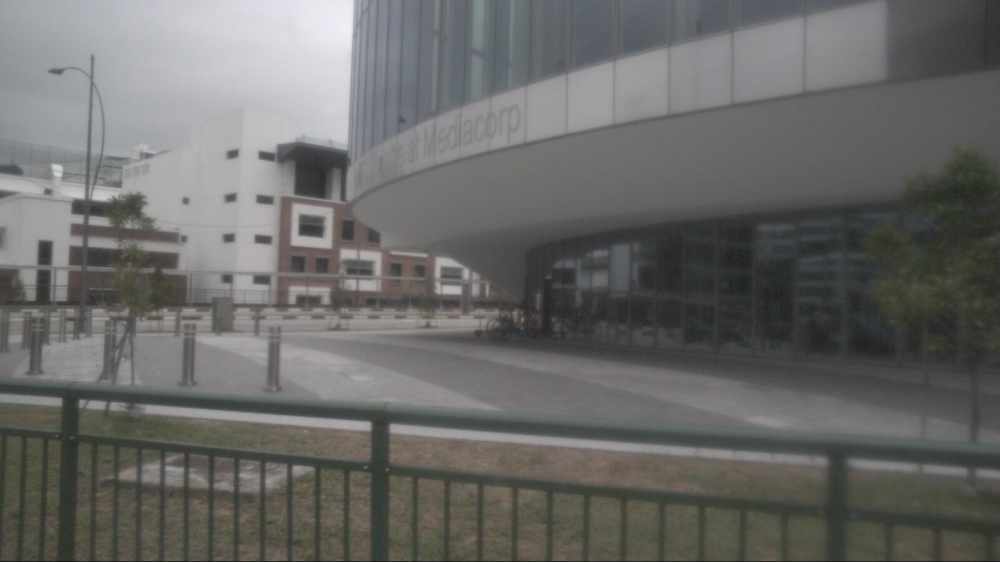

In [ ]:
from detectron2.utils.visualizer import ColorMode

metadata = MetadataCatalog.get("my_dataset_train")

im = cv2.imread("/content/val2017/n003-2018-01-02-14-02-53+0800__CAM_BACK_LEFT__1514873168872317.jpg")
outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
v = Visualizer(im[:, :, ::-1],
                metadata=metadata,
                scale=1.0,
)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

Evaluate the performance.

In [26]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

# NOTE: if you see NaN value: that (most likely) means the class doesn't exist in validation data
# NOTE: if you see NaN value: that (most likely) means the class doesn't exist in validation data
# especially you don't take 100% of the validation set

[07/02 17:05:48 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [07/02 17:05:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/02 17:05:51 d2.data.datasets.coco]: Loaded 14884 images in COCO format from /content/val.json
[07/02 17:05:53 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/02 17:05:53 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/02 17:05:53 d2.data.common]: Serializing 14884 elements to byte tensors and concatenating them all ...
[07/02 17:05:53 d2.data.common]: Serialized dataset takes 7.67 MiB
[07/02 17:05:54 d2.evaluation.evaluator]: Start inference on 14884 batches
[07/02 17:05:54 d2.evaluation.evaluator]: Inference done 11/14884. Dataloading: 0.0015 s/iter. Inference:

In [30]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# how many images per forward pass
BATCH_SIZE  = 10           # try larger/smaller to match your GPU
NUM_WORKERS = 10           # CPU preprocessing threads
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val",batch_size=BATCH_SIZE,
                num_workers=NUM_WORKERS)   # speeds up CPU ⇢ GPU pipeline)
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[07/02 17:17:59 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
[07/02 17:18:03 d2.data.datasets.coco]: Loading /content/val.json takes 2.87 seconds.
WARNING [07/02 17:18:03 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/02 17:18:03 d2.data.datasets.coco]: Loaded 14884 images in COCO format from /content/val.json
[07/02 17:18:03 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[07/02 17:18:03 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[07/02 17:18:03 d2.data.common]: Serializing 14884 elements to byte tensors and concatenating them all ...
[07/02 17:18:04 d2.data.common]: Serialized dataset takes 7.67 MiB
[07/02 17:18:04 d2.evaluation.evaluator]: Start inference on 1489 batches
[07/02 17:18:08 d2.e